In [1]:
import anndata
import pandas
import scanpy
import scvi
import torch
import numpy
import seaborn
import loupepy
import scipy
import matplotlib
from matplotlib import pyplot

/home/wsl_user/miniforge3/envs/scvi2/lib/python3.11/site-packages/jaxlib/plugin_support.py:71: RuntimeWarning: JAX plugin jax_cuda12_plugin version 0.7.2 is installed, but it is not compatible with the installed jaxlib version 0.7.1, so it will not be used.
  warnings.warn(


In [2]:
loupepy.setup()

This tool is independently maintained, but utilizes 10x genomics tools to perform conversions
By using this tool, you agree to the 10X Genomics End User License Agreement (https://www.10xgenomics.com/legal/end-user-software-license-agreement ).
Do you agree to the terms of the EULA? (yes/y or no/n)


In [4]:
working_dir = "../working_dir/"

h5ad_dir = "cellbender_h5ad/expect_10k_tuned_v4/background_removed/"

genotype = "wildtype"

out_file_prefix = genotype + "_all"

We load both the raw and filtered h5ads, the subset the raw ones based on which ones remain after filtering. I didn't directly use the filtered ones to ensure we don't accidentally start with non-raw counts.

In [14]:
adata_a0_s1 = anndata.io.read_h5ad(working_dir + h5ad_dir + genotype + "_a0_s1.h5ad")
adata_a0_s2 = anndata.io.read_h5ad(working_dir + h5ad_dir + genotype + "_a0_s2.h5ad")

adata_p1_s1 = anndata.io.read_h5ad(working_dir + h5ad_dir + genotype + "_p1_s1.h5ad")
adata_p1_s2 = anndata.io.read_h5ad(working_dir + h5ad_dir + genotype + "_p1_s2.h5ad")

adata_p2_s1 = anndata.io.read_h5ad(working_dir + h5ad_dir + genotype + "_p2_s1.h5ad")
adata_p2_s2 = anndata.io.read_h5ad(working_dir + h5ad_dir + genotype + "_p2_s2.h5ad")

adata_p3_s1 = anndata.io.read_h5ad(working_dir + h5ad_dir + genotype + "_p3_s1.h5ad")
adata_p3_s2 = anndata.io.read_h5ad(working_dir + h5ad_dir + genotype + "_p3_s2.h5ad")

adata_p4_s1 = anndata.io.read_h5ad(working_dir + h5ad_dir + genotype + "_p4_s1.h5ad")
adata_p4_s2 = anndata.io.read_h5ad(working_dir + h5ad_dir + genotype + "_p4_s2.h5ad")

adata_wp_s1 = anndata.io.read_h5ad(working_dir + h5ad_dir + genotype + "_wp_s1.h5ad")
adata_wp_s2 = anndata.io.read_h5ad(working_dir + h5ad_dir + genotype + "_wp_s2.h5ad")

In [15]:
adata_a0_filtered = anndata.io.read_h5ad("cluster_by_stage_filtered_only/" + genotype + "_a0.h5ad")

adata_p1_filtered = anndata.io.read_h5ad("cluster_by_stage_filtered_only/" + genotype + "_p1.h5ad")

adata_p2_filtered = anndata.io.read_h5ad("cluster_by_stage_filtered_only/" + genotype + "_p2.h5ad")

adata_p3_filtered = anndata.io.read_h5ad("cluster_by_stage_filtered_only/" + genotype + "_p3.h5ad")

adata_p4_filtered = anndata.io.read_h5ad("cluster_by_stage_filtered_only/" + genotype + "_p4.h5ad")

adata_wp_filtered = anndata.io.read_h5ad("cluster_by_stage_filtered_only/" + genotype + "_wp.h5ad")

In [16]:
adata_a0_s1_filtered = adata_a0_s1[[o for o in adata_a0_s1.obs_names if o in adata_a0_filtered.obs_names],
                          [v for v in adata_a0_s1.var_names if v in adata_a0_filtered.var_names]]
adata_a0_s2_filtered = adata_a0_s2[[o for o in adata_a0_s2.obs_names if o in adata_a0_filtered.obs_names],
                          [v for v in adata_a0_s2.var_names if v in adata_a0_filtered.var_names]]

adata_p1_s1_filtered = adata_p1_s1[[o for o in adata_p1_s1.obs_names if o in adata_p1_filtered.obs_names],
                          [v for v in adata_p1_s1.var_names if v in adata_p1_filtered.var_names]]
adata_p1_s2_filtered = adata_p1_s2[[o for o in adata_p1_s2.obs_names if o in adata_p1_filtered.obs_names],
                          [v for v in adata_p1_s2.var_names if v in adata_p1_filtered.var_names]]

adata_p2_s1_filtered = adata_p2_s1[[o for o in adata_p2_s1.obs_names if o in adata_p2_filtered.obs_names],
                          [v for v in adata_p2_s1.var_names if v in adata_p2_filtered.var_names]]
adata_p2_s2_filtered = adata_p2_s2[[o for o in adata_p2_s2.obs_names if o in adata_p2_filtered.obs_names],
                          [v for v in adata_p2_s2.var_names if v in adata_p2_filtered.var_names]]

adata_p3_s1_filtered = adata_p3_s1[[o for o in adata_p3_s1.obs_names if o in adata_p3_filtered.obs_names],
                          [v for v in adata_p3_s1.var_names if v in adata_p3_filtered.var_names]]
adata_p3_s2_filtered = adata_p3_s2[[o for o in adata_p3_s2.obs_names if o in adata_p3_filtered.obs_names],
                          [v for v in adata_p3_s2.var_names if v in adata_p3_filtered.var_names]]

adata_p4_s1_filtered = adata_p4_s1[[o for o in adata_p4_s1.obs_names if o in adata_p4_filtered.obs_names],
                          [v for v in adata_p4_s1.var_names if v in adata_p4_filtered.var_names]]
adata_p4_s2_filtered = adata_p4_s2[[o for o in adata_p4_s2.obs_names if o in adata_p4_filtered.obs_names],
                          [v for v in adata_p4_s2.var_names if v in adata_p4_filtered.var_names]]

adata_wp_s1_filtered = adata_wp_s1[[o for o in adata_wp_s1.obs_names if o in adata_wp_filtered.obs_names],
                          [v for v in adata_wp_s1.var_names if v in adata_wp_filtered.var_names]]
adata_wp_s2_filtered = adata_wp_s2[[o for o in adata_wp_s2.obs_names if o in adata_wp_filtered.obs_names],
                          [v for v in adata_wp_s2.var_names if v in adata_wp_filtered.var_names]]

In [10]:
adata = anndata.concat([adata_a0_s1_filtered,
                        adata_a0_s2_filtered,
                        adata_p1_s1_filtered,
                        adata_p1_s2_filtered,
                        adata_p2_s1_filtered,
                        adata_p2_s2_filtered,
                        adata_p3_s1_filtered,
                        adata_p3_s2_filtered,
                        adata_p4_s1_filtered,
                        adata_p4_s2_filtered,
                        adata_wp_s1_filtered,
                        adata_wp_s2_filtered],
                       join='outer')  # Outer join prevents the removal of genes that aren't expressed in every library
adata

AnnData object with n_obs × n_vars = 109207 × 14101
    obs: 'library_id', 'genotype', 'stage', 'sample', 'study', 'spliced_counts', 'unspliced_counts', 'ambiguous_counts', 'fraction_unspliced_ambiguous', 'fraction_unspliced_unambiguous'

In [11]:
adata.obs["library_id"].value_counts(sort = False)

library_id
wildtype_a0_s1    11177
wildtype_a0_s2     8373
wildtype_p1_s1     8651
wildtype_p1_s2     9168
wildtype_p2_s1     6496
wildtype_p2_s2     6030
wildtype_p3_s1    10603
wildtype_p3_s2    11292
wildtype_p4_s1     6596
wildtype_p4_s2     4791
wildtype_wp_s1    12607
wildtype_wp_s2    13423
Name: count, dtype: int64

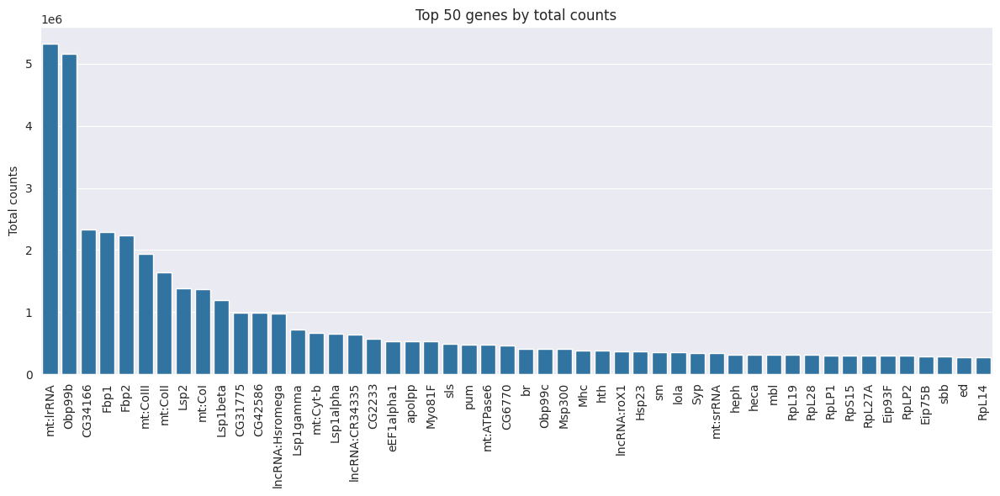

In [12]:
top_n = 50

sums = numpy.asarray(adata.X.sum(axis=0)).ravel()

top_idx = numpy.argsort(sums)[::-1][:top_n]

df_top = pandas.DataFrame({"gene": adata.var_names[top_idx], "total_count": sums[top_idx]})

pyplot.figure(figsize=(12, 6))
seaborn.barplot(x="gene", y="total_count", data=df_top, color="C0")
pyplot.xticks(rotation=90)
pyplot.ylabel("Total counts")
pyplot.xlabel("")
pyplot.title(f"Top {top_n} genes by total counts")
pyplot.tight_layout()
pyplot.show()

In [13]:
mtRNA = pandas.read_csv("../preprocessing_and_cell_calling/symbol_mtRNA.csv", header = None)[0].tolist()
rRNA = pandas.read_csv("../preprocessing_and_cell_calling/symbol_rRNA_no_pre.csv", header = None)[0].tolist()
ribo_protein = pandas.read_csv("../preprocessing_and_cell_calling/symbol_ribo_protein.csv", header = None)[0].tolist()
mito_ribo_protein = pandas.read_csv("../preprocessing_and_cell_calling/symbol_mito_ribo_protein.csv", header = None)[0].tolist()

adata.var["mtRNA"] = adata.var_names.isin(mtRNA)
adata.var["rRNA"] = adata.var_names.isin(rRNA)
adata.var["ribo_protein"] = adata.var_names.isin(ribo_protein)
adata.var["mito_ribo_protein"] = adata.var_names.isin(mito_ribo_protein)
adata.var["all_ribo_protein"] = adata.var_names.isin(ribo_protein) | adata.var_names.isin(mito_ribo_protein)

In [14]:
adata

AnnData object with n_obs × n_vars = 109207 × 14101
    obs: 'library_id', 'genotype', 'stage', 'sample', 'study', 'spliced_counts', 'unspliced_counts', 'ambiguous_counts', 'fraction_unspliced_ambiguous', 'fraction_unspliced_unambiguous'
    var: 'mtRNA', 'rRNA', 'ribo_protein', 'mito_ribo_protein', 'all_ribo_protein'

In [15]:
scanpy.pp.calculate_qc_metrics(adata,
                               qc_vars=["mtRNA", "rRNA", "ribo_protein", "mito_ribo_protein", "all_ribo_protein"],
                               inplace=True)

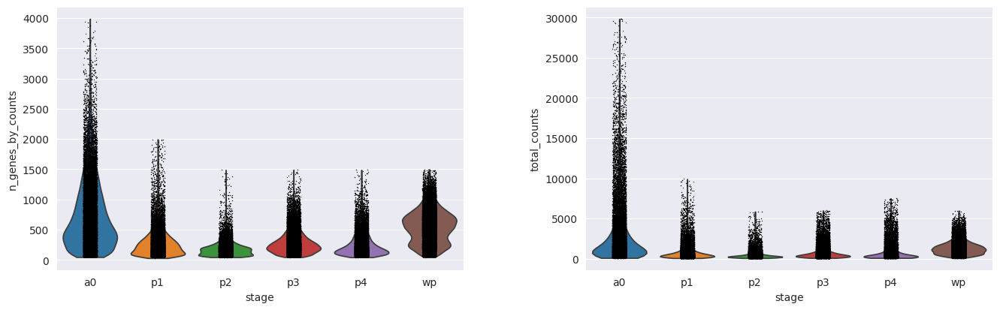

In [16]:
scanpy.pl.violin(
    adata,
    ["n_genes_by_counts", "total_counts"],
    groupby="stage",
    multi_panel=True,
)

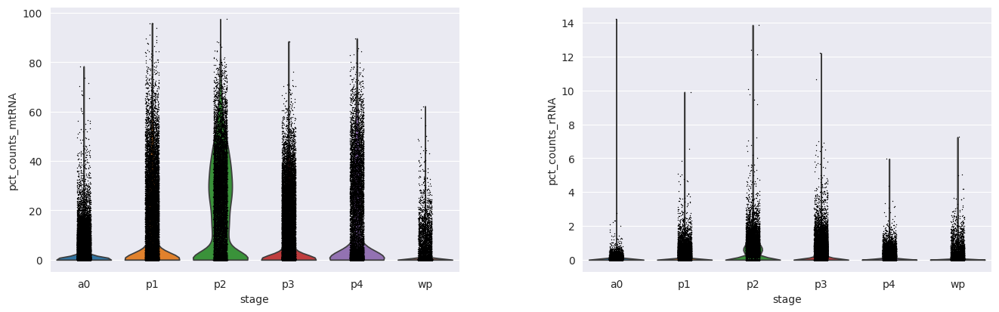

In [17]:
scanpy.pl.violin(
    adata,
    ["pct_counts_mtRNA", "pct_counts_rRNA"],
    groupby="stage",
    multi_panel=True,
)

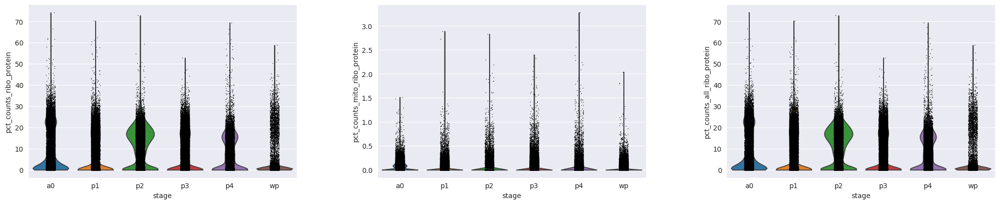

In [18]:
scanpy.pl.violin(
    adata,
    ["pct_counts_ribo_protein", "pct_counts_mito_ribo_protein", "pct_counts_all_ribo_protein"],
    groupby="stage",
    multi_panel=True,
)

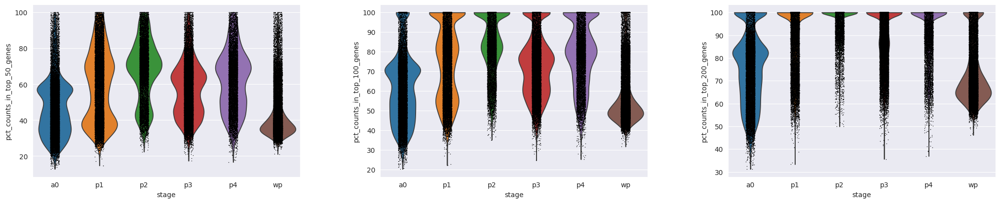

In [19]:
scanpy.pl.violin(
    adata,
    ["pct_counts_in_top_50_genes", "pct_counts_in_top_100_genes", "pct_counts_in_top_200_genes"],
    groupby="stage",
    multi_panel=True,
)

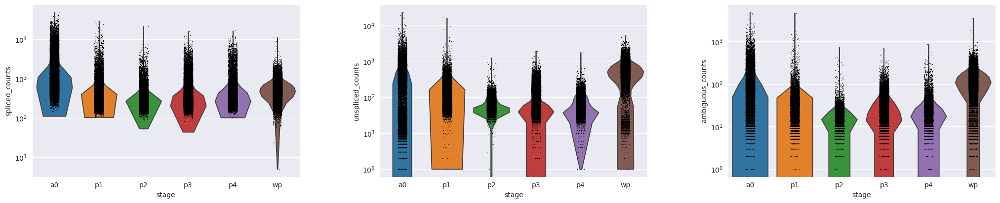

In [20]:
scanpy.pl.violin(
    adata,
    ["spliced_counts", "unspliced_counts", "ambiguous_counts"],
    log=True,
    groupby="stage",
    multi_panel=True,
)

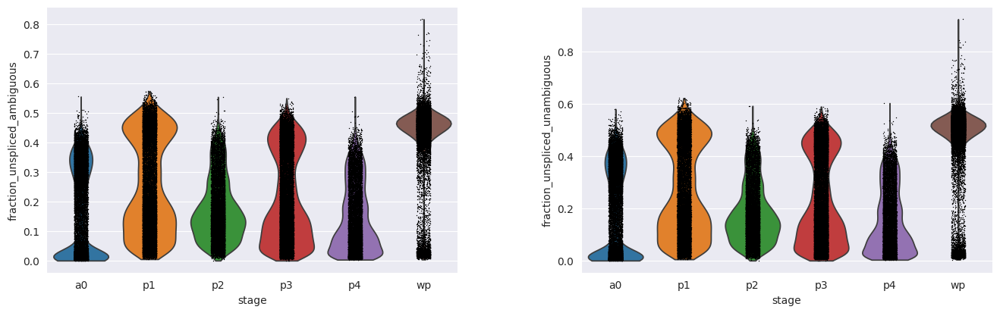

In [21]:
scanpy.pl.violin(
    adata,
    ["fraction_unspliced_ambiguous", "fraction_unspliced_unambiguous"],
    groupby="stage",
    multi_panel=True,
)

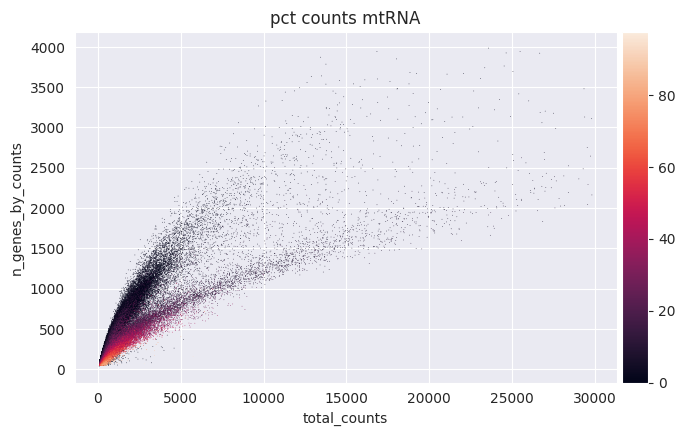

In [22]:
scanpy.pl.scatter(adata, "total_counts", "n_genes_by_counts", color="pct_counts_mtRNA")

In [23]:
adata

AnnData object with n_obs × n_vars = 109207 × 14101
    obs: 'library_id', 'genotype', 'stage', 'sample', 'study', 'spliced_counts', 'unspliced_counts', 'ambiguous_counts', 'fraction_unspliced_ambiguous', 'fraction_unspliced_unambiguous', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mtRNA', 'log1p_total_counts_mtRNA', 'pct_counts_mtRNA', 'total_counts_rRNA', 'log1p_total_counts_rRNA', 'pct_counts_rRNA', 'total_counts_ribo_protein', 'log1p_total_counts_ribo_protein', 'pct_counts_ribo_protein', 'total_counts_mito_ribo_protein', 'log1p_total_counts_mito_ribo_protein', 'pct_counts_mito_ribo_protein', 'total_counts_all_ribo_protein', 'log1p_total_counts_all_ribo_protein', 'pct_counts_all_ribo_protein'
    var: 'mtRNA', 'rRNA', 'ribo_protein', 'mito_ribo_protein', 'all_ribo_protein', 'n_cells_by_counts', 'mean_counts

In [24]:
adata.layers["counts"] = adata.X.copy()
adata.raw = adata.copy()
scanpy.pp.normalize_total(adata,
                          target_sum=1e6)
scanpy.pp.log1p(adata)

In [32]:
scanpy.pp.highly_variable_genes(adata,
                                n_top_genes=100000,
                                batch_key="library_id",
                                flavor="seurat_v3",
                                layer="counts",
                                subset=True)

In [33]:
scvi.model.SCVI.setup_anndata(adata,
                              layer="counts",
                              batch_key="library_id")

In [34]:
scvi_model = scvi.model.SCVI(adata,
                             n_hidden=128,
                             n_layers=2,
                             n_latent=10,
                             dispersion="gene")

In [35]:
scvi.settings.dl_num_workers = 35
torch.set_float32_matmul_precision("high")

scvi_model.train(max_epochs = 40,
                 log_every_n_steps = 1,
                 check_val_every_n_epoch=1,
                 early_stopping = True)

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Training:   0%|          | 0/40 [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_epochs=40` reached.


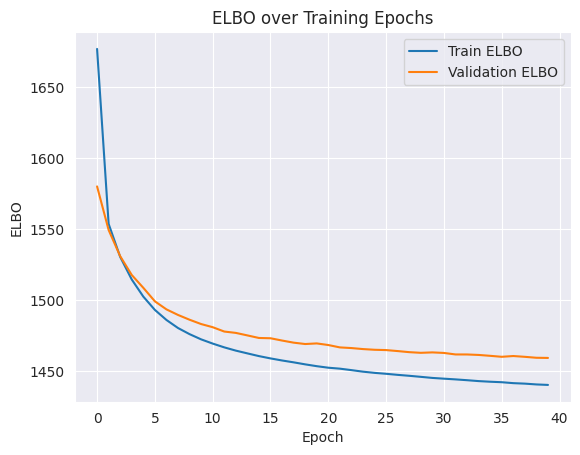

In [36]:
history = scvi_model.history
history.keys()
pyplot.plot(history["elbo_train"], label="Train ELBO")
pyplot.plot(history["elbo_validation"], label="Validation ELBO")
pyplot.xlabel("Epoch")
pyplot.ylabel("ELBO")
pyplot.title("ELBO over Training Epochs")
pyplot.legend()
pyplot.show()

In [54]:
scvi_model.save(out_file_prefix + "_model.pt")

In [8]:
scvi_model = scvi.model.SCVI.load(out_file_prefix + "_model.pt", adata)

INFO     File wildtype_all_model.pt/model.pt already downloaded                                                    


In [29]:
SCVI_LATENT_KEY = "X_scVI"
adata.obsm[SCVI_LATENT_KEY] = scvi_model.get_latent_representation()

In [29]:
scanpy.pp.neighbors(adata, use_rep=SCVI_LATENT_KEY)

Exception ignored in: <bound method IPythonKernel._clean_thread_parent_frames of <ipykernel.ipkernel.IPythonKernel object at 0x782100829d10>>
Traceback (most recent call last):
  File "/home/wsl_user/miniforge3/envs/scvi2/lib/python3.11/site-packages/ipykernel/ipkernel.py", line 781, in _clean_thread_parent_frames
    def _clean_thread_parent_frames(

KeyboardInterrupt: 

KeyboardInterrupt



KeyboardInterrupt: 

In [39]:
scanpy.tl.umap(adata)

Note that batch mixing doesn't look so good this time. Either the parameters need to be optimized somehow, or this is simply due to major biological differences.

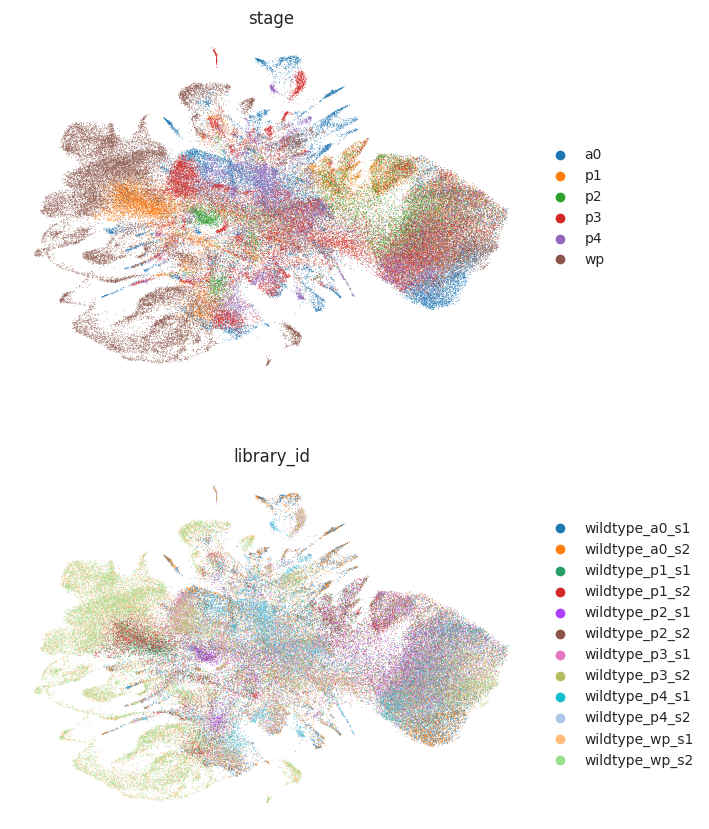

In [40]:
scanpy.pl.umap(
    adata,
    color=["stage", "library_id"],
    frameon=False,
    ncols=1,
)

In [41]:
scanpy.tl.tsne(adata,
           use_rep=SCVI_LATENT_KEY)

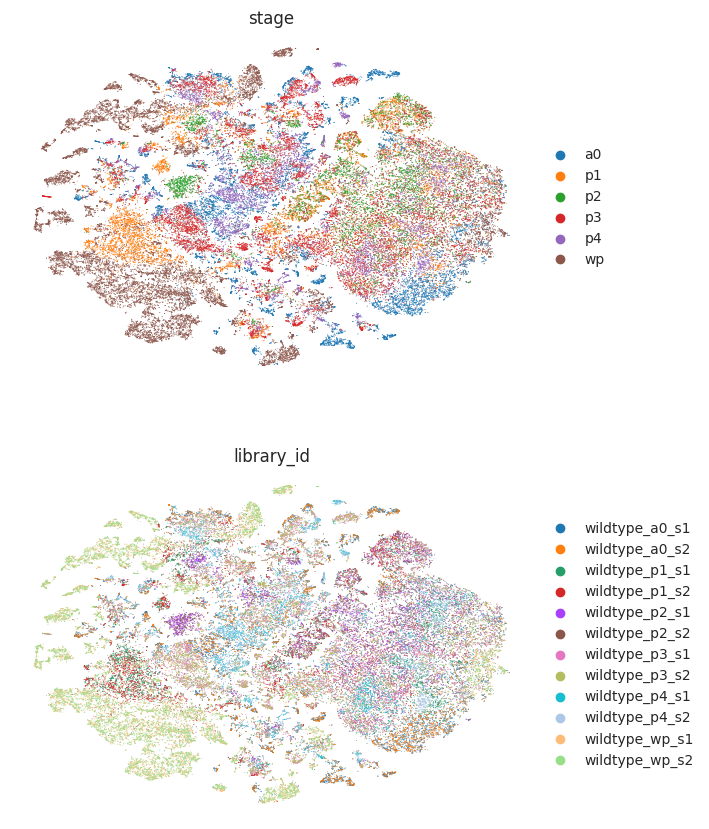

In [42]:
scanpy.pl.tsne(
    adata,
    color=["stage", "library_id"],
    frameon=False,
    ncols=1,
)

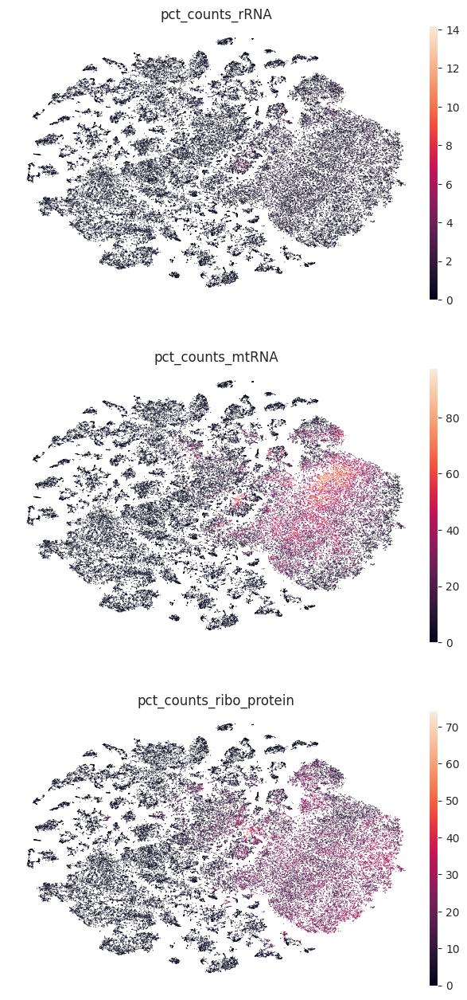

In [89]:
scanpy.pl.tsne(
    adata,
    color=["pct_counts_rRNA", "pct_counts_mtRNA", "pct_counts_ribo_protein"],
    frameon=False,
    ncols=1,
)

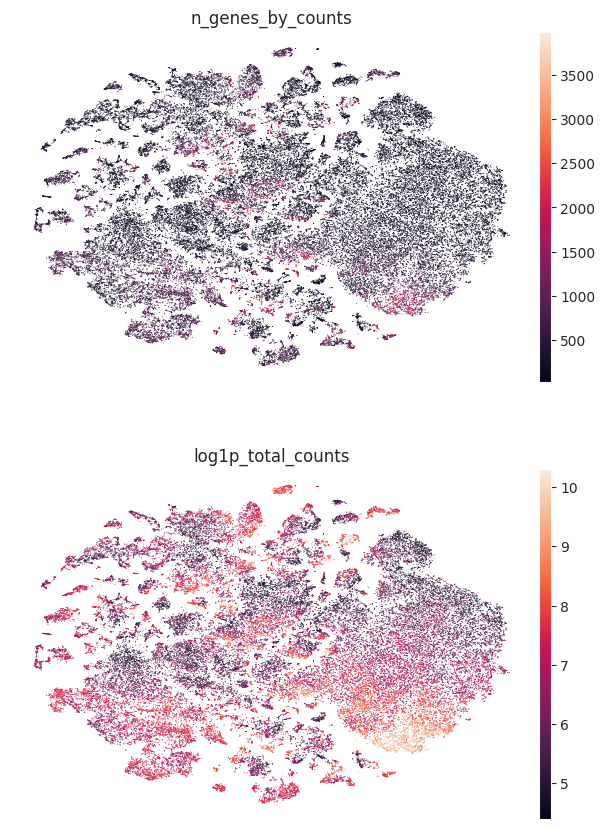

In [44]:
scanpy.pl.tsne(
    adata,
    color=["n_genes_by_counts", "log1p_total_counts"],
    frameon=False,
    ncols=1,
)

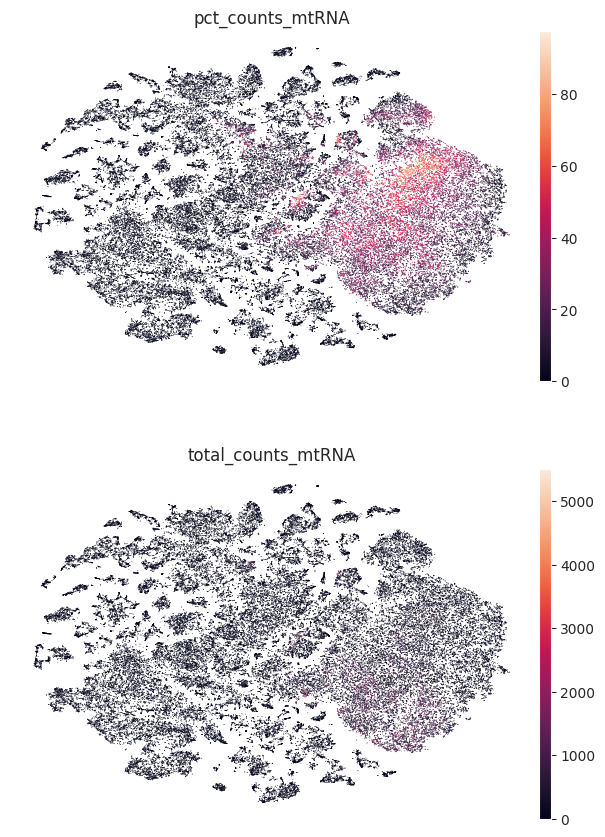

In [45]:
scanpy.pl.tsne(
    adata,
    color=["pct_counts_mtRNA", "total_counts_mtRNA"],
    frameon=False,
    ncols=1,
)

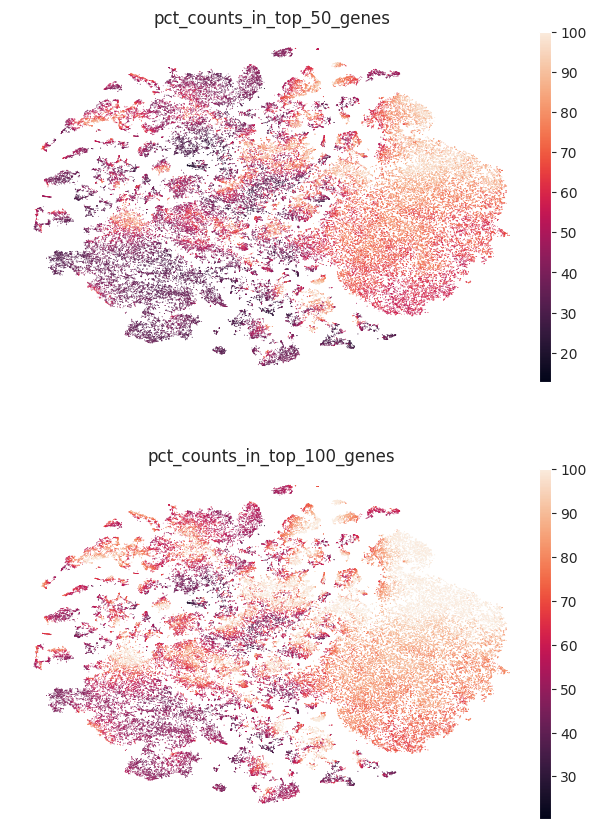

In [46]:
scanpy.pl.tsne(
    adata,
    color=["pct_counts_in_top_50_genes", "pct_counts_in_top_100_genes"],
    frameon=False,
    ncols=1,
)

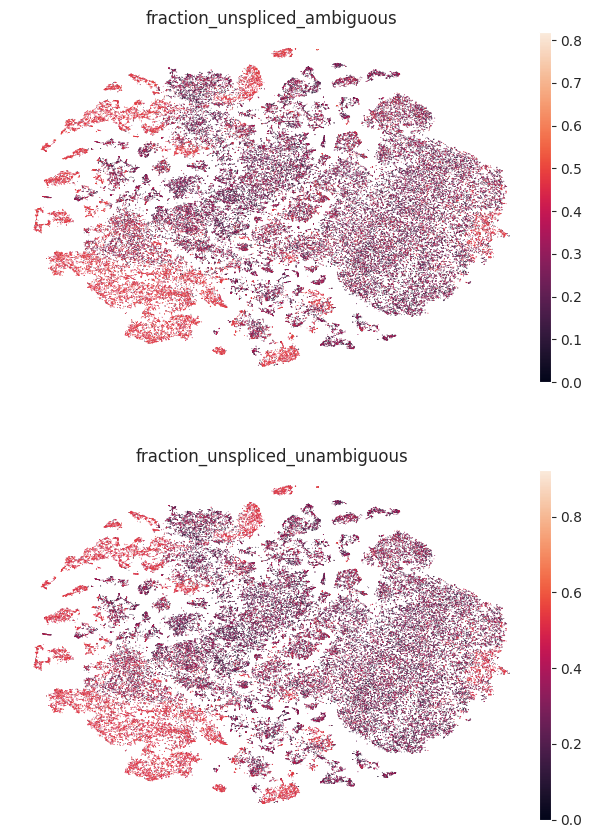

In [47]:
scanpy.pl.tsne(
    adata,
    color=["fraction_unspliced_ambiguous", "fraction_unspliced_unambiguous"],
    frameon=False,
    ncols=1,
)

In [49]:
scanpy.tl.tsne(adata,
               use_rep=SCVI_LATENT_KEY,
               perplexity=50,
               key_added="X_tsne_perp50")
scanpy.tl.tsne(adata,
               use_rep=SCVI_LATENT_KEY,
               early_exaggeration=24,
               key_added="X_tsne_ee24")
scanpy.tl.tsne(adata,
               use_rep=SCVI_LATENT_KEY,
               early_exaggeration=24,
               perplexity=50,
               key_added="X_tsne_perp50_ee24")
scanpy.tl.tsne(adata,
               use_rep=SCVI_LATENT_KEY,
               early_exaggeration=50,
               perplexity=100,
               key_added="X_tsne_perp100_ee50")

In [50]:
scanpy.tl.leiden(adata,
                 flavor="igraph",
                 resolution=0.5,
                 key_added="leiden_res0.5")
scanpy.tl.leiden(adata,
                 flavor="igraph",
                 resolution=1,
                 key_added="leiden_res1")
scanpy.tl.leiden(adata,
                 flavor="igraph",
                 resolution=2,
                 key_added="leiden_res2")
scanpy.tl.leiden(adata,
                 flavor="igraph",
                 resolution=5,
                 key_added="leiden_res5")
scanpy.tl.leiden(adata,
                 flavor="igraph",
                 resolution=10,
                 key_added="leiden_res10")

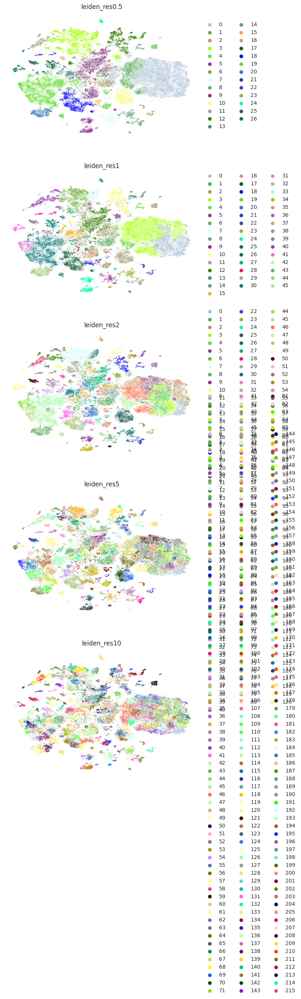

In [51]:
scanpy.pl.embedding(
    adata,
    basis="X_tsne_perp100_ee50",
    color=["leiden_res0.5", "leiden_res1", "leiden_res2", "leiden_res5", "leiden_res10"],
    frameon=False,
    ncols=1,
    palette=list(matplotlib.colors.XKCD_COLORS.values())
)

In [52]:
adata

AnnData object with n_obs × n_vars = 109207 × 14101
    obs: 'library_id', 'genotype', 'stage', 'sample', 'study', 'spliced_counts', 'unspliced_counts', 'ambiguous_counts', 'fraction_unspliced_ambiguous', 'fraction_unspliced_unambiguous', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mtRNA', 'log1p_total_counts_mtRNA', 'pct_counts_mtRNA', 'total_counts_rRNA', 'log1p_total_counts_rRNA', 'pct_counts_rRNA', 'total_counts_ribo_protein', 'log1p_total_counts_ribo_protein', 'pct_counts_ribo_protein', 'total_counts_mito_ribo_protein', 'log1p_total_counts_mito_ribo_protein', 'pct_counts_mito_ribo_protein', 'total_counts_all_ribo_protein', 'log1p_total_counts_all_ribo_protein', 'pct_counts_all_ribo_protein', '_scvi_batch', '_scvi_labels', 'leiden_res0.5', 'leiden_res1', 'leiden_res2', 'leiden_res5', 'leiden_res10'
    var

In [53]:
adata.write_h5ad(out_file_prefix + ".h5ad")

In [5]:
adata = anndata.read_h5ad(out_file_prefix + ".h5ad")

Everything has been pretty much the same, but now we are going to integrate with the FCA for cell type projection.

In [17]:
adata_combined = anndata.concat([adata_a0_s1_filtered,
                                 adata_a0_s2_filtered,
                                 adata_p1_s1_filtered,
                                 adata_p1_s2_filtered,
                                 adata_p2_s1_filtered,
                                 adata_p2_s2_filtered,
                                 adata_p3_s1_filtered,
                                 adata_p3_s2_filtered,
                                 adata_p4_s1_filtered,
                                 adata_p4_s2_filtered,
                                 adata_wp_s1_filtered,
                                 adata_wp_s2_filtered],
                                join='outer')
adata_combined

AnnData object with n_obs × n_vars = 109207 × 14101
    obs: 'library_id', 'genotype', 'stage', 'sample', 'study', 'spliced_counts', 'unspliced_counts', 'ambiguous_counts', 'fraction_unspliced_ambiguous', 'fraction_unspliced_unambiguous'

In [18]:
adata_FCA = anndata.io.read_h5ad("adata_FCA.h5ad")
adata_FCA

AnnData object with n_obs × n_vars = 253968 × 15017
    obs: 'R_annotation', 'R_annotation__ontology_id', 'R_annotation_broad', 'R_annotation_broad__ontology_id', 'age', 'sex', 'tissue', 'batch', 'DIY_annotation', 'study', 'n_genes', 'n_counts'
    var: 'gene_names', 'n_cells', 'n_counts'

In [19]:
adata_combined.obs["R_annotation"] = "unknown"
adata_combined.obs["R_annotation_broad"] = "unknown"
adata_combined.obs["DIY_annotation"] = "unknown"
adata_combined.obs["batch"] = adata_combined.obs["library_id"]
adata_combined

AnnData object with n_obs × n_vars = 109207 × 14101
    obs: 'library_id', 'genotype', 'stage', 'sample', 'study', 'spliced_counts', 'unspliced_counts', 'ambiguous_counts', 'fraction_unspliced_ambiguous', 'fraction_unspliced_unambiguous', 'R_annotation', 'R_annotation_broad', 'DIY_annotation', 'batch'

In [20]:
# Need the outer join to preserve genes, but now any obs that aren't in both datasets are partially uninitialized
# might actually be better for batch correction to do an inner join

adata_combined = anndata.concat([adata_combined,
                                 adata_FCA],
                                 join='outer')
adata_combined

AnnData object with n_obs × n_vars = 363175 × 16286
    obs: 'library_id', 'genotype', 'stage', 'sample', 'study', 'spliced_counts', 'unspliced_counts', 'ambiguous_counts', 'fraction_unspliced_ambiguous', 'fraction_unspliced_unambiguous', 'R_annotation', 'R_annotation_broad', 'DIY_annotation', 'batch', 'R_annotation__ontology_id', 'R_annotation_broad__ontology_id', 'age', 'sex', 'tissue', 'n_genes', 'n_counts'

In [27]:
adata_combined.layers["counts"] = adata_combined.X.copy()
adata_combined.raw = adata_combined.copy()
scanpy.pp.normalize_total(adata_combined,
                          target_sum=1e6)
scanpy.pp.log1p(adata_combined)

In [28]:
scanpy.pp.highly_variable_genes(adata_combined,
                                n_top_genes=100000,
                                batch_key="batch",
                                flavor="seurat_v3",
                                layer="counts",
                                subset=True)

Adds an extra covariate to batch correct over, since there are likely major differences between our data and the FCA.

In [38]:
scvi.model.SCVI.setup_anndata(adata_combined,
                              layer="counts",
                              batch_key="batch",
                              categorical_covariate_keys=["study"])

In [39]:
scvi_model_combined = scvi.model.SCVI(adata_combined,
                             n_hidden=256,
                             n_layers=2,
                             n_latent=10,
                             dispersion="gene")

In [40]:
scvi_model_combined.train(max_epochs = 30,
                          log_every_n_steps = 1,
                          check_val_every_n_epoch=1,
                          early_stopping = True)

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
You are using a CUDA device ('NVIDIA GeForce RTX 5060 Ti') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
/home/wsl_user/miniforge3/envs/scvi2/lib/python3.11/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:433: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=35` in the `DataLoader` to improve performance.
/home/wsl_user/miniforge3/envs/scvi2/lib/python3.11/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:433: The 'val_dataloader' 

Training:   0%|          | 0/30 [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_epochs=30` reached.


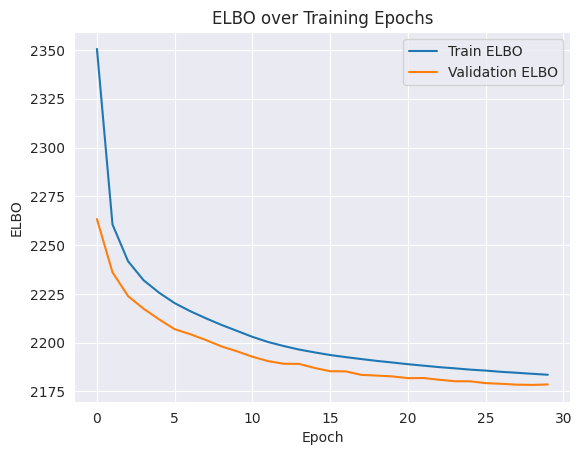

In [41]:
history = scvi_model_combined.history
history.keys()
pyplot.plot(history["elbo_train"], label="Train ELBO")
pyplot.plot(history["elbo_validation"], label="Validation ELBO")
pyplot.xlabel("Epoch")
pyplot.ylabel("ELBO")
pyplot.title("ELBO over Training Epochs")
pyplot.legend()
pyplot.show()

In [42]:
SCVI_LATENT_KEY = "X_scVI"
adata_combined.obsm[SCVI_LATENT_KEY] = scvi_model_combined.get_latent_representation()

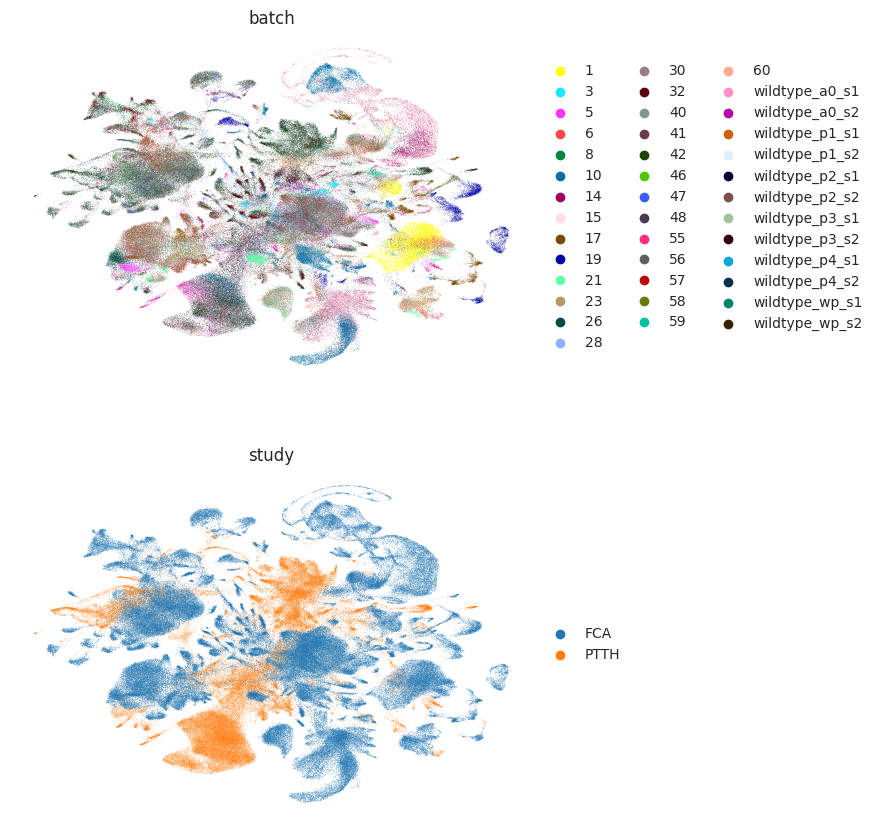

In [43]:
# quick UMAP to make sure studies are mixed. Looks like they aren't. That's a problem for future me.

scanpy.pp.neighbors(adata_combined, use_rep=SCVI_LATENT_KEY)
scanpy.tl.umap(adata_combined)
scanpy.pl.umap(
    adata_combined,
    color=["batch", "study"],
    frameon=False,
    ncols=1,
)

In [45]:
scvi_model_combined.save(out_file_prefix + "_combined_scvi_model.pt")

In [46]:
scvi_model_combined = scvi.model.SCVI.load(out_file_prefix + "_combined_scvi_model.pt", adata_combined)

INFO     File wildtype_all_combined_scvi_model.pt/model.pt already downloaded                                      


We train a model for each of the cell type annotations.

In [21]:
SCANVI_CELLTYPE_KEY_FCA = "celltype_scanvi_FCA"
adata_combined.obs[SCANVI_CELLTYPE_KEY_FCA] = adata_combined.obs["R_annotation"]

SCANVI_CELLTYPE_KEY_FCA_BROAD = "celltype_scanvi_FCA_broad"
adata_combined.obs[SCANVI_CELLTYPE_KEY_FCA_BROAD] = adata_combined.obs["R_annotation_broad"]

SCANVI_CELLTYPE_KEY_DIY = "celltype_scanvi_DIY"
adata_combined.obs[SCANVI_CELLTYPE_KEY_DIY] = adata_combined.obs["DIY_annotation"]

In [77]:
scanvi_model_FCA_broad = scvi.model.SCANVI.from_scvi_model(
    scvi_model_combined,
    adata=adata_combined,
    unlabeled_category="unknown",
    labels_key=SCANVI_CELLTYPE_KEY_FCA_BROAD
)

In [78]:
scanvi_model_FCA_broad.train(max_epochs=30,
                   n_samples_per_label=None,
                   check_val_every_n_epoch = 1,
                   log_every_n_steps = 1,
                   early_stopping = True
                   )

INFO     Training for 30 epochs.                                                                                   


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
/home/wsl_user/miniforge3/envs/scvi2/lib/python3.11/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:433: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=35` in the `DataLoader` to improve performance.
/home/wsl_user/miniforge3/envs/scvi2/lib/python3.11/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:433: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=35` in the `DataLoader` to improve performance.


Training:   0%|          | 0/30 [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_epochs=30` reached.


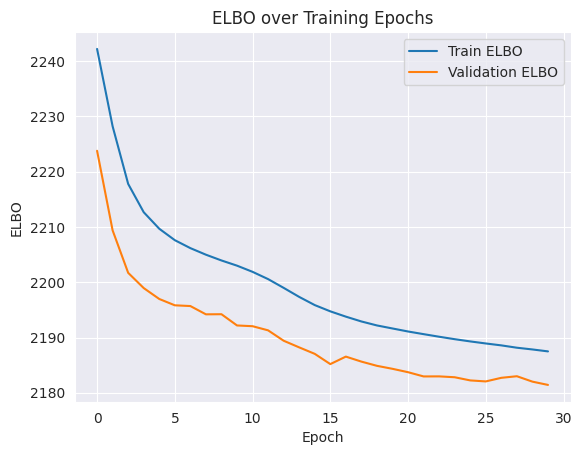

In [81]:
history2 = scanvi_model_FCA_broad.history
history2.keys()
pyplot.plot(history2["elbo_train"], label="Train ELBO")
pyplot.plot(history2["elbo_validation"], label="Validation ELBO")
pyplot.xlabel("Epoch")
pyplot.ylabel("ELBO")
pyplot.title("ELBO over Training Epochs")
pyplot.legend()
pyplot.show()

In [82]:
scanvi_model_FCA_broad.save("wildtype_all_combined_scvi_model_FCAA_broad.pt")

In [29]:
scanvi_model_FCA_broad = scvi.model.SCANVI.load("wildtype_all_combined_scvi_model_FCAA_broad.pt", adata_combined)

INFO     File wildtype_all_combined_scvi_model_FCAA_broad.pt/model.pt already downloaded                           


In [30]:
SCANVI_LATENT_KEY_FCA_BROAD = "X_scANVI_FCA_broad"
SCANVI_PREDICTION_KEY_FCA_BROAD = "C_scANVI_FCA_broad"

adata_combined.obsm[SCANVI_LATENT_KEY_FCA_BROAD] = scanvi_model_FCA_broad.get_latent_representation(adata_combined)
adata_combined.obs[SCANVI_PREDICTION_KEY_FCA_BROAD] = scanvi_model_FCA_broad.predict(adata_combined)

In [31]:
adata.obs["celltype_scanvi_FCA_broad"] = adata_combined[adata_combined.obs["study"] == "PTTH"].obs[SCANVI_PREDICTION_KEY_FCA_BROAD]

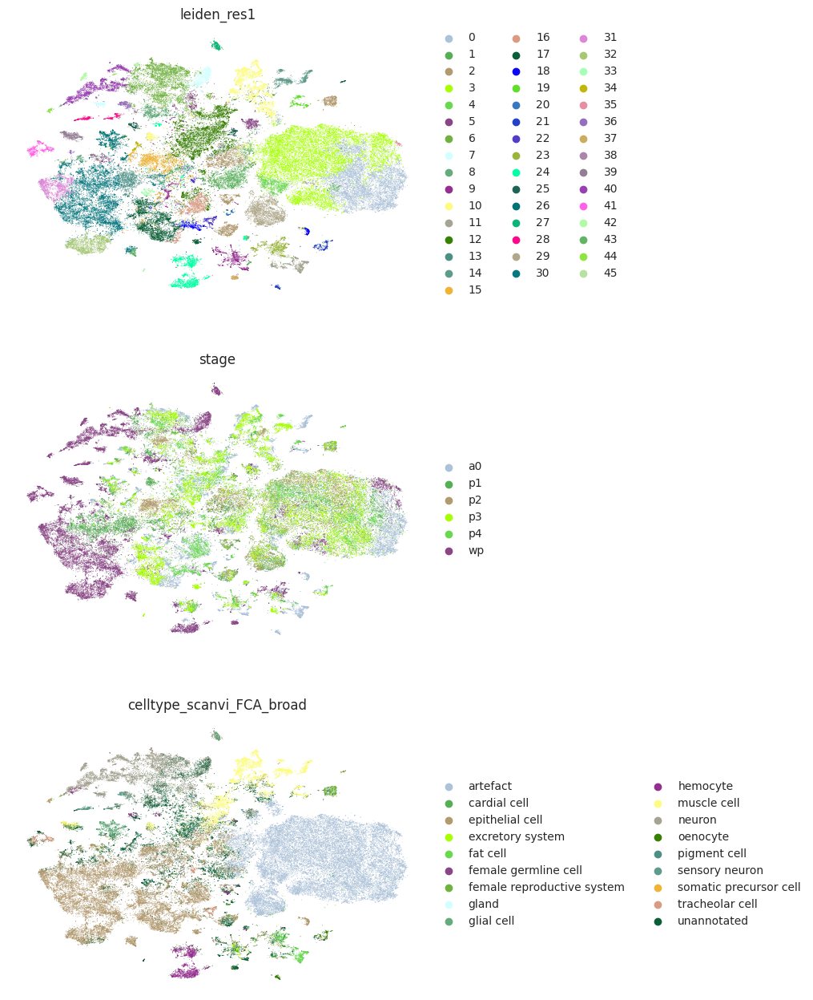

In [32]:
scanpy.pl.embedding(
    adata,
    basis="X_tsne_perp100_ee50",
    color=["leiden_res1", "stage", "celltype_scanvi_FCA_broad"],
    frameon=False,
    ncols=1,
    palette=list(matplotlib.colors.XKCD_COLORS.values())
)

In [93]:
scanvi_model_FCA = scvi.model.SCANVI.from_scvi_model(
    scvi_model_combined,
    adata=adata_combined,
    unlabeled_category="unknown",
    labels_key=SCANVI_CELLTYPE_KEY_FCA
)

In [94]:
scanvi_model_FCA.train(max_epochs=30,
                   n_samples_per_label=None,
                   check_val_every_n_epoch = 1,
                   log_every_n_steps = 1,
                   early_stopping = True
                   )

INFO     Training for 30 epochs.                                                                                   


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
/home/wsl_user/miniforge3/envs/scvi2/lib/python3.11/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:433: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=35` in the `DataLoader` to improve performance.
/home/wsl_user/miniforge3/envs/scvi2/lib/python3.11/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:433: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=35` in the `DataLoader` to improve performance.


Training:   0%|          | 0/30 [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_epochs=30` reached.


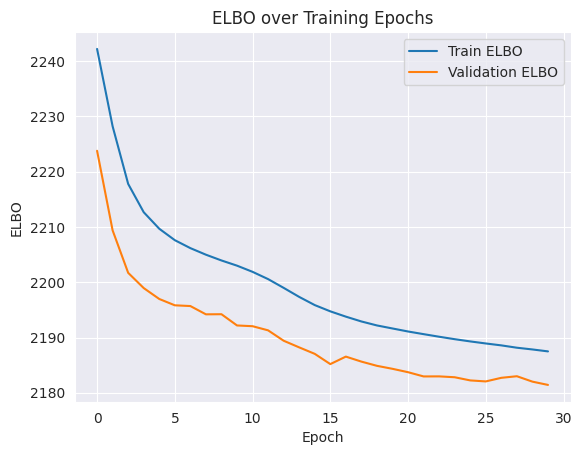

In [95]:
history3 = scanvi_model_FCA.history
history3.keys()
pyplot.plot(history2["elbo_train"], label="Train ELBO")
pyplot.plot(history2["elbo_validation"], label="Validation ELBO")
pyplot.xlabel("Epoch")
pyplot.ylabel("ELBO")
pyplot.title("ELBO over Training Epochs")
pyplot.legend()
pyplot.show()

In [96]:
scanvi_model_FCA.save("wildtype_all_combined_scvi_model_FCA.pt")

In [33]:
scanvi_model_FCA = scvi.model.SCANVI.load("wildtype_all_combined_scvi_model_FCA.pt", adata_combined)

INFO     File wildtype_all_combined_scvi_model_FCA.pt/model.pt already downloaded                                  


In [34]:
SCANVI_LATENT_KEY_FCA = "X_scANVI_FCA"
SCANVI_PREDICTION_KEY_FCA = "C_scANVI_FCA"

adata_combined.obsm[SCANVI_LATENT_KEY_FCA] = scanvi_model_FCA.get_latent_representation(adata_combined)
adata_combined.obs[SCANVI_PREDICTION_KEY_FCA] = scanvi_model_FCA.predict(adata_combined)

In [35]:
adata.obs["celltype_scanvi_FCA"] = adata_combined[adata_combined.obs["study"] == "PTTH"].obs[SCANVI_PREDICTION_KEY_FCA]

In [99]:
scanvi_model_DIY = scvi.model.SCANVI.from_scvi_model(
    scvi_model_combined,
    adata=adata_combined,
    unlabeled_category="unknown",
    labels_key=SCANVI_CELLTYPE_KEY_DIY
)

In [100]:
scanvi_model_DIY.train(max_epochs=30,
                   n_samples_per_label=None,
                   check_val_every_n_epoch = 1,
                   log_every_n_steps = 1,
                   early_stopping = True
                   )

INFO     Training for 30 epochs.                                                                                   


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
/home/wsl_user/miniforge3/envs/scvi2/lib/python3.11/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:433: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=35` in the `DataLoader` to improve performance.
/home/wsl_user/miniforge3/envs/scvi2/lib/python3.11/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:433: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=35` in the `DataLoader` to improve performance.


Training:   0%|          | 0/30 [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_epochs=30` reached.


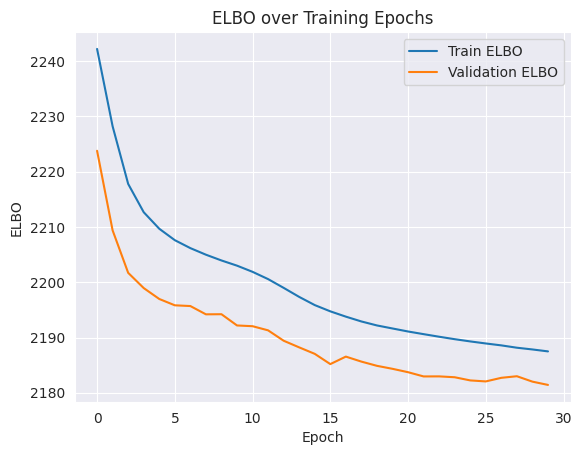

In [101]:
history4 = scanvi_model_DIY.history
history4.keys()
pyplot.plot(history2["elbo_train"], label="Train ELBO")
pyplot.plot(history2["elbo_validation"], label="Validation ELBO")
pyplot.xlabel("Epoch")
pyplot.ylabel("ELBO")
pyplot.title("ELBO over Training Epochs")
pyplot.legend()
pyplot.show()

In [102]:
scanvi_model_DIY.save("wildtype_all_combined_scvi_model_DIY.pt")

In [36]:
scanvi_model_DIY = scvi.model.SCANVI.load("wildtype_all_combined_scvi_model_DIY.pt", adata_combined)

INFO     File wildtype_all_combined_scvi_model_DIY.pt/model.pt already downloaded                                  


In [37]:
SCANVI_LATENT_KEY_DIY = "X_scANVI_DIY"
SCANVI_PREDICTION_KEY_DIY = "C_scANVI_DIY"

adata_combined.obsm[SCANVI_LATENT_KEY_DIY] = scanvi_model_DIY.get_latent_representation(adata_combined)
adata_combined.obs[SCANVI_PREDICTION_KEY_DIY] = scanvi_model_DIY.predict(adata_combined)

In [38]:
adata.obs["celltype_scanvi_DIY"] = adata_combined[adata_combined.obs["study"] == "PTTH"].obs[SCANVI_PREDICTION_KEY_DIY]

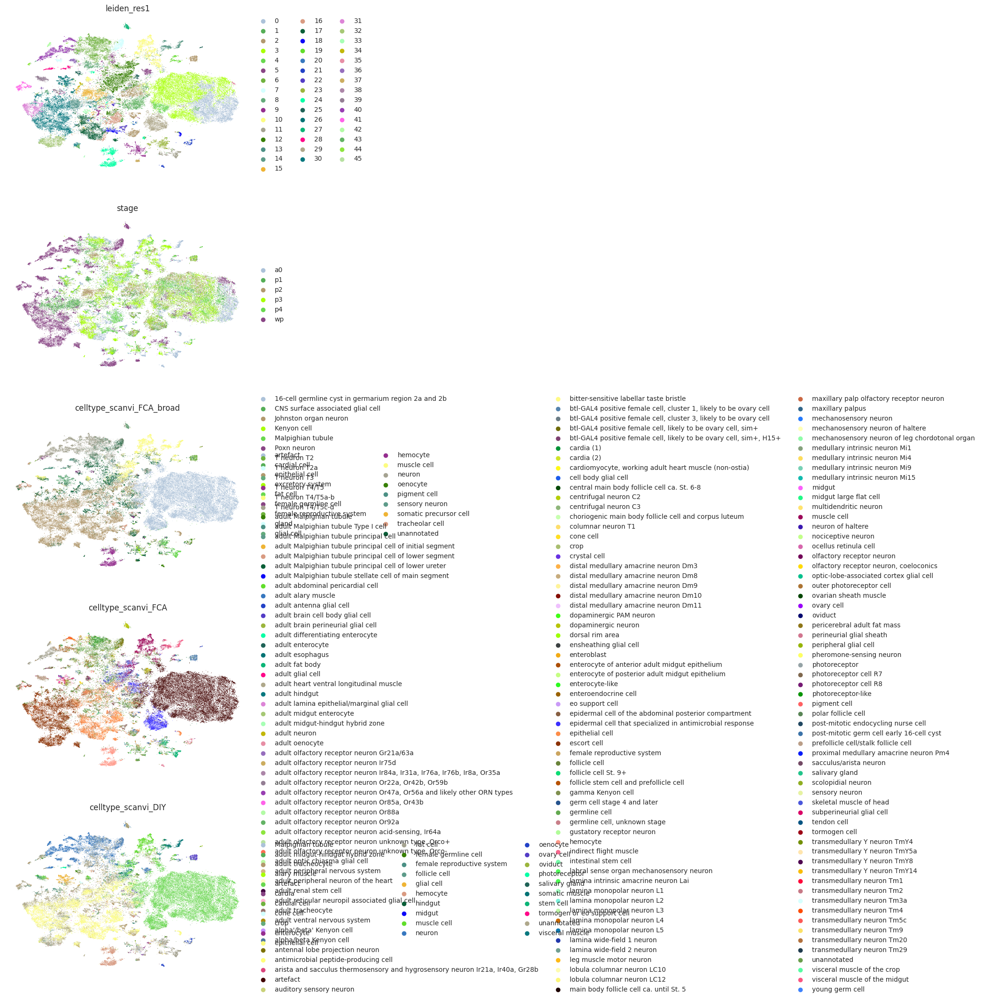

In [105]:
scanpy.pl.embedding(
    adata,
    basis="X_tsne_perp100_ee50",
    color=["leiden_res1", "stage", "celltype_scanvi_FCA_broad", "celltype_scanvi_FCA", "celltype_scanvi_DIY"],
    frameon=False,
    ncols=1,
    palette=list(matplotlib.colors.XKCD_COLORS.values())
)

In [10]:
adata_cellxgene = adata.copy()

In [80]:
import random

colors = list(matplotlib.colors.XKCD_COLORS.values())
colors.remove("#000000")
random.shuffle(colors)

In [73]:
stage_colors = ["#3cb44b",
                "#0000ff",
                "#f032e6",
                "#ffe119",
                "#9A6324",
                "#f58231"]

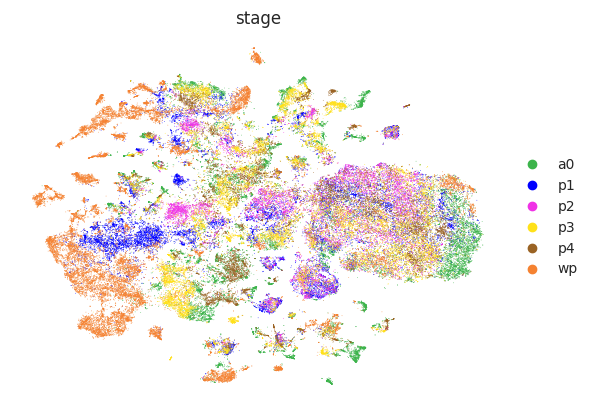

In [74]:
scanpy.pl.embedding(
    adata,
    basis="X_tsne_perp100_ee50",
    color=["stage"],
    frameon=False,
    ncols=1,
    palette=stage_colors
)

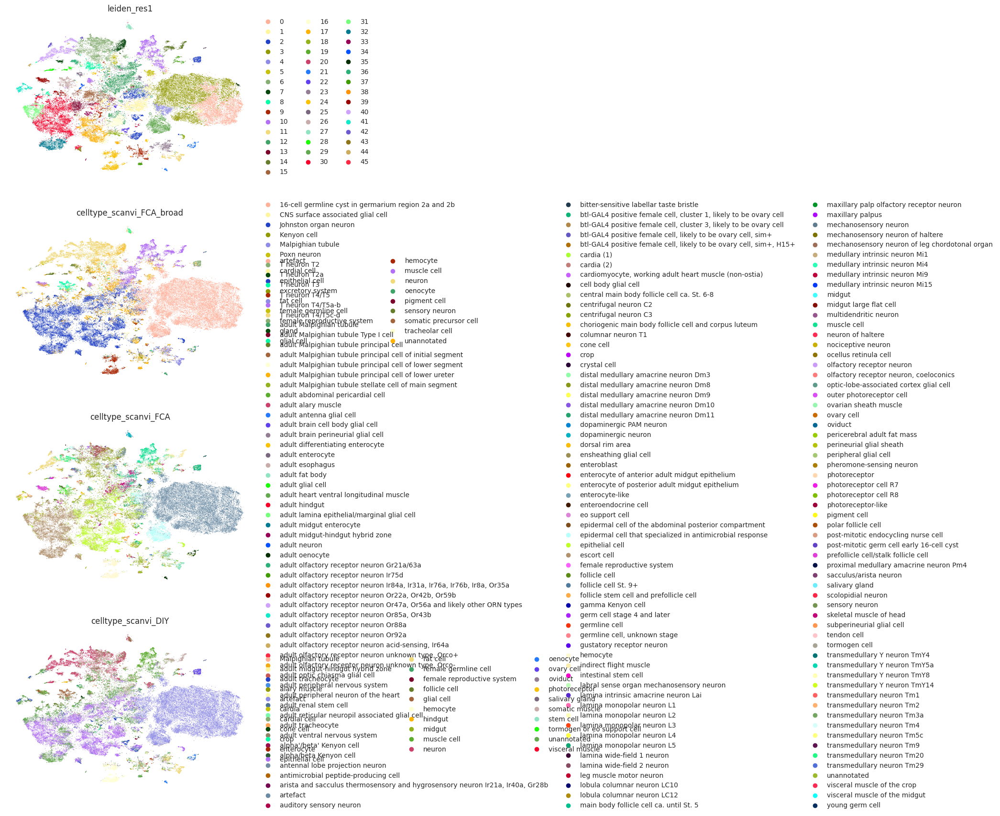

In [81]:
scanpy.pl.embedding(
    adata,
    basis="X_tsne_perp100_ee50",
    color=["leiden_res1", "celltype_scanvi_FCA_broad", "celltype_scanvi_FCA", "celltype_scanvi_DIY"],
    frameon=False,
    ncols=1,
    palette=colors
)

In [111]:
adata

AnnData object with n_obs × n_vars = 109207 × 14101
    obs: 'library_id', 'genotype', 'stage', 'sample', 'study', 'spliced_counts', 'unspliced_counts', 'ambiguous_counts', 'fraction_unspliced_ambiguous', 'fraction_unspliced_unambiguous', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mtRNA', 'log1p_total_counts_mtRNA', 'pct_counts_mtRNA', 'total_counts_rRNA', 'log1p_total_counts_rRNA', 'pct_counts_rRNA', 'total_counts_ribo_protein', 'log1p_total_counts_ribo_protein', 'pct_counts_ribo_protein', 'total_counts_mito_ribo_protein', 'log1p_total_counts_mito_ribo_protein', 'pct_counts_mito_ribo_protein', 'total_counts_all_ribo_protein', 'log1p_total_counts_all_ribo_protein', 'pct_counts_all_ribo_protein', '_scvi_batch', '_scvi_labels', 'leiden_res0.5', 'leiden_res1', 'leiden_res2', 'leiden_res5', 'leiden_res10', 'cellt

In [82]:
adata_cellxgene.uns[f"{SCANVI_PREDICTION_KEY_FCA}_colors"] = colors
adata_cellxgene.uns[f"{SCANVI_PREDICTION_KEY_DIY}_colors"] = colors
adata_cellxgene.uns[f"{SCANVI_PREDICTION_KEY_FCA_BROAD}_colors"] = colors
adata_cellxgene.uns["leiden_res0.5_colors"] = colors
adata_cellxgene.uns["leiden_res1_colors"] = colors
adata_cellxgene.uns["leiden_res2_colors"] = colors
adata_cellxgene.uns["leiden_res5_colors"] = colors
adata_cellxgene.uns["leiden_res10_colors"] = colors
adata_cellxgene.uns["stage_colors"] = stage_colors
#TODO: set other colors

In [69]:
#might need to delete these, sometimes cellxgene doesn't like them for some reason
#del adata_cellxgene.obsm["_scvi_extra_continuous_covs"]
#del adata_cellxgene.obsm["_scvi_extra_categorical_covs"]

In [ ]:
# Gets original unnormalized counts with no batch correction
# Useful for testing since it is much faster than get_normalized_expression
#adata_loupe.X = adata_loupe.raw[:, [g for g in adata_loupe.raw.var_names if g in adata_loupe.var_names]].X

Even with 10 only samples, this uses A LOT of memory. Be sure you saved everything before running this, it's likely to crash Jupyter and/or WSL.

In [9]:
norm = scipy.sparse.csr_matrix(
    scvi_model.get_normalized_expression(adata,
                                         n_samples = 10,
                                         transform_batch = numpy.unique(adata.obs["library_id"]).tolist(),
                                         library_size = "latent",
                                         return_numpy=True
                                         ))

In [83]:
adata_cellxgene.X = norm

In [84]:
adata_cellxgene.write_h5ad("cluster_by_stage/cellxgene/" + out_file_prefix + ".h5ad")

In [88]:
loupepy.create_loupe_from_anndata(adata_cellxgene,
                                  output_cloupe="cluster_by_stage/loupe/" + out_file_prefix + ".cloupe",
                                  force=True)

2025/11/12 19:51:22 validating input file: tmp.h5
2025/11/12 19:51:29 initializing loupe file: /tmp/534414879.cloupe
2025/11/12 19:51:29 converting count matrix
2025/11/12 19:52:24 converting projections
2025/11/12 19:52:25 converting clusters
2025/11/12 19:52:25 finished loupe file: /tmp/534414879.cloupe
2025/11/12 19:52:25 copying loupe file to: cluster_by_stage/loupe/wildtype_all.cloupe


In [87]:
adata.write_h5ad("cluster_by_stage/" + out_file_prefix + "_final.h5ad")